In [1]:
# Load the necessary libraries
import warnings
warnings.filterwarnings("ignore")

import os
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.models import save_model, load_model
from tensorflow.keras.preprocessing import image as keras_image
from sklearn.model_selection import train_test_split, GridSearchCV
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [2]:
data_dir = '/kaggle/input/plantvillage-dataset/color'

class_folders = os.listdir(data_dir)
image_paths = []
labels = []

for class_folder in class_folders:
    class_path = os.path.join(data_dir, class_folder)
    image_files = os.listdir(class_path)
    for image_file in image_files:
        image_path = os.path.join(class_path, image_file)
        image_paths.append(image_path)
        labels.append(class_folder)

df = pd.DataFrame({'image_path': image_paths, 'label': labels})

In [3]:
df.head()

,image_path,label
0,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
1,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
2,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
3,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
4,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight


In [4]:
df.shape

(54305, 2)

In [5]:
print("The classes:\n", np.unique(df['label']))

The classes:
 ['Apple___Apple_scab' 'Apple___Black_rot' 'Apple___Cedar_apple_rust'
 'Apple___healthy' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew'
 'Cherry_(including_sour)___healthy'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Corn_(maize)___Common_rust_' 'Corn_(maize)___Northern_Leaf_Blight'
 'Corn_(maize)___healthy' 'Grape___Black_rot'
 'Grape___Esca_(Black_Measles)'
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Peach___Bacterial_spot'
 'Peach___healthy' 'Pepper,_bell___Bacterial_spot'
 'Pepper,_bell___healthy' 'Potato___Early_blight' 'Potato___Late_blight'
 'Potato___healthy' 'Raspberry___healthy' 'Soybean___healthy'
 'Squash___Powdery_mildew' 'Strawberry___Leaf_scorch'
 'Strawberry___healthy' 'Tomato___Bacterial_spot' 'Tomato___Early_blight'
 'Tomato___Late_blight' 'Tomato___Leaf_Mold' 'Tomato___Septoria_leaf_spot'
 'Tomato___Spider_mites Two-spotted_spider_mite' 'Tomato___Target_Spot'


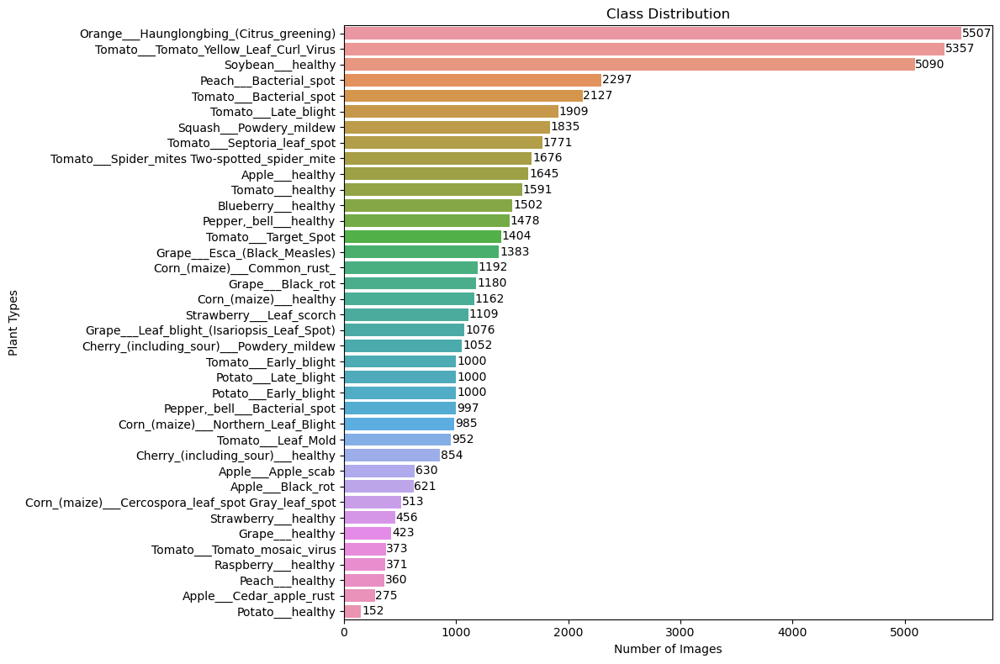

In [6]:
# Count the number of images in each class
class_counts = df['label'].value_counts()

# Visualize class distribution using a horizontal bar plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=class_counts.values, y=class_counts.index, orient='h')
plt.title('Class Distribution')
plt.xlabel('Number of Images')
plt.ylabel('Plant Types')
plt.tight_layout()  # Adjust the layout to prevent overlapping labels

# Add data labels to each bar
for i, v in enumerate(class_counts.values):
    ax.text(v + 5, i, str(v), color='black', va='center')

plt.show()

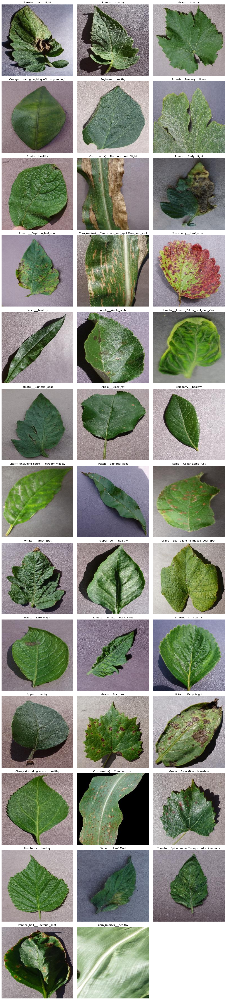

In [7]:
# Display sample images from each class
num_classes = len(df['label'].unique())
num_images_per_row = 3
num_rows = (num_classes + num_images_per_row - 1) // num_images_per_row

plt.figure(figsize=(15, 5 * num_rows))  # Adjust figure size based on the number of rows

for i, plant_class in enumerate(df['label'].unique()):
    plt.subplot(num_rows, num_images_per_row, i + 1)
    
    # Inside the loop for displaying sample images
    image_path = os.path.join(data_dir, df[df['label'] == plant_class]['image_path'].iloc[0])

    # Check if the image exists and can be loaded
    if os.path.exists(image_path):
        sample_image = cv2.imread(image_path)
        if sample_image is not None:
            plt.imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
            plt.title(plant_class)
            plt.axis('off')
        else:
            print(f"Error: Unable to load image from path: {image_path}")
    else:
        print(f"Error: Image path does not exist: {image_path}")

plt.tight_layout()
plt.show()

## Preprocessing Data

In [8]:
class_labels_dict = {class_label: idx for idx, class_label in enumerate(np.unique(df['label']))}
df['label'] = df['label'].map(class_labels_dict)

In [9]:
# Split the data into training and test sets (80% training, 20% test)
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

In [10]:
train_df.shape, test_df.shape

((43444, 2), (10861, 2))

In [11]:
# Split the training data into training and validation sets (80% training, 20% validation)
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42)

In [12]:
train_df.shape, val_df.shape

((34755, 2), (8689, 2))

In [13]:
train_df['label'] = train_df['label'].astype(str)
val_df['label']   = val_df['label'].astype(str)
test_df['label']  = test_df['label'].astype(str)

In [14]:
print(train_df['label'].unique())

['35' '24' '8' '9' '5' '15' '4' '11' '33' '12' '19' '27' '32' '13' '26'
 '1' '16' '3' '21' '14' '28' '30' '6' '34' '29' '25' '31' '20' '0' '10'
 '37' '17' '18' '23' '36' '7' '2' '22']


In [15]:
# Set the image and batch size
image_size = (224, 224)
batch_size = 40

# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)

# Load and augment the training data
train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='image_path',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Load the validation data
val_generator = val_datagen.flow_from_dataframe(
    val_df,
    x_col='image_path',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Load the pre-trained VGG16 model without the top (fully connected) layers
base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers so they are not updated during training
for layer in base_model.layers:
    layer.trainable = False
    
num_classes = len(class_labels_dict)

# Add custom top layers for your specific classification task
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Create the transfer learning model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_generator, epochs=10, validation_data=val_generator)

Found 34755 validated image filenames belonging to 38 classes.
Found 8689 validated image filenames belonging to 38 classes.
17225924/17225924 [==============================] - 1s 0us/step
Epoch 1/10
869/869 [==============================] - 645s 732ms/step - loss: 0.3814 - accuracy: 0.8849 - val_loss: 0.2370 - val_accuracy: 0.9210
Epoch 2/10
869/869 [==============================] - 469s 540ms/step - loss: 0.1970 - accuracy: 0.9359 - val_loss: 0.1889 - val_accuracy: 0.9335
Epoch 3/10
869/869 [==============================] - 459s 529ms/step - loss: 0.1610 - accuracy: 0.9452 - val_loss: 0.1744 - val_accuracy: 0.9397
Epoch 4/10
869/869 [==============================] - 449s 516ms/step - loss: 0.1439 - accuracy: 0.9518 - val_loss: 0.1634 - val_accuracy: 0.9429
Epoch 5/10
869/869 [==============================] - 503s 578ms/step - loss: 0.1335 - accuracy: 0.9547 - val_loss: 0.1279 - val_accuracy: 0.9573
Epoch 6/10
869/869 [==============================] - 511s 588ms/step - loss: 0.

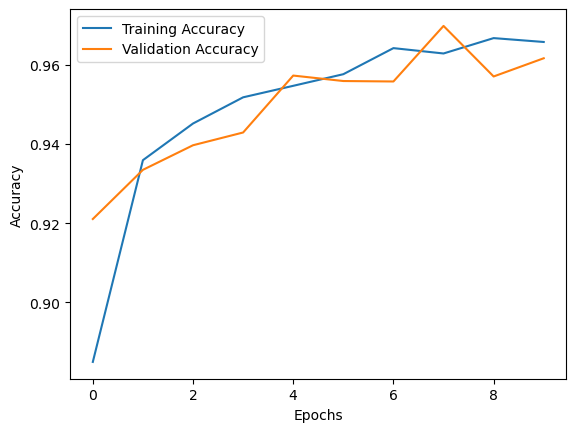

In [18]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

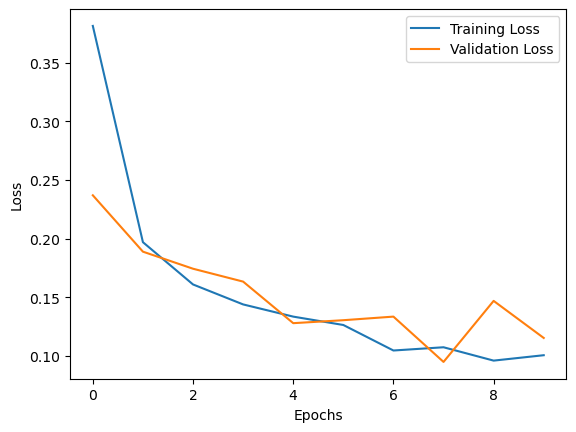

In [19]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [21]:
# Save the Fine-tuned Model
model.save('plant_disease_model.h5')

# Load the saved model with the best hyperparameters
loaded_model = load_model('plant_disease_model.h5')

In [24]:
# Load the test data
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
    test_df,
    x_col='image_path',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 10861 validated image filenames belonging to 38 classes.


In [25]:
# Evaluate the model on the test dataset
loss, accuracy = model.evaluate(test_generator)

272/272 [==============================] - 86s 315ms/step - loss: 0.1263 - accuracy: 0.9591


In [26]:
# Perform predictions on the test dataset
y_pred_prob = model.predict(test_generator)
y_pred = np.argmax(y_pred_prob, axis=1)

# Get the true labels for the test set
y_true = test_generator.classes

# Create a DataFrame for analysis
error_df = pd.DataFrame({'True Label': y_true, 'Predicted Label': y_pred})

# Misclassified images
misclassified_images = error_df[error_df['True Label'] != error_df['Predicted Label']]

272/272 [==============================] - 36s 129ms/step


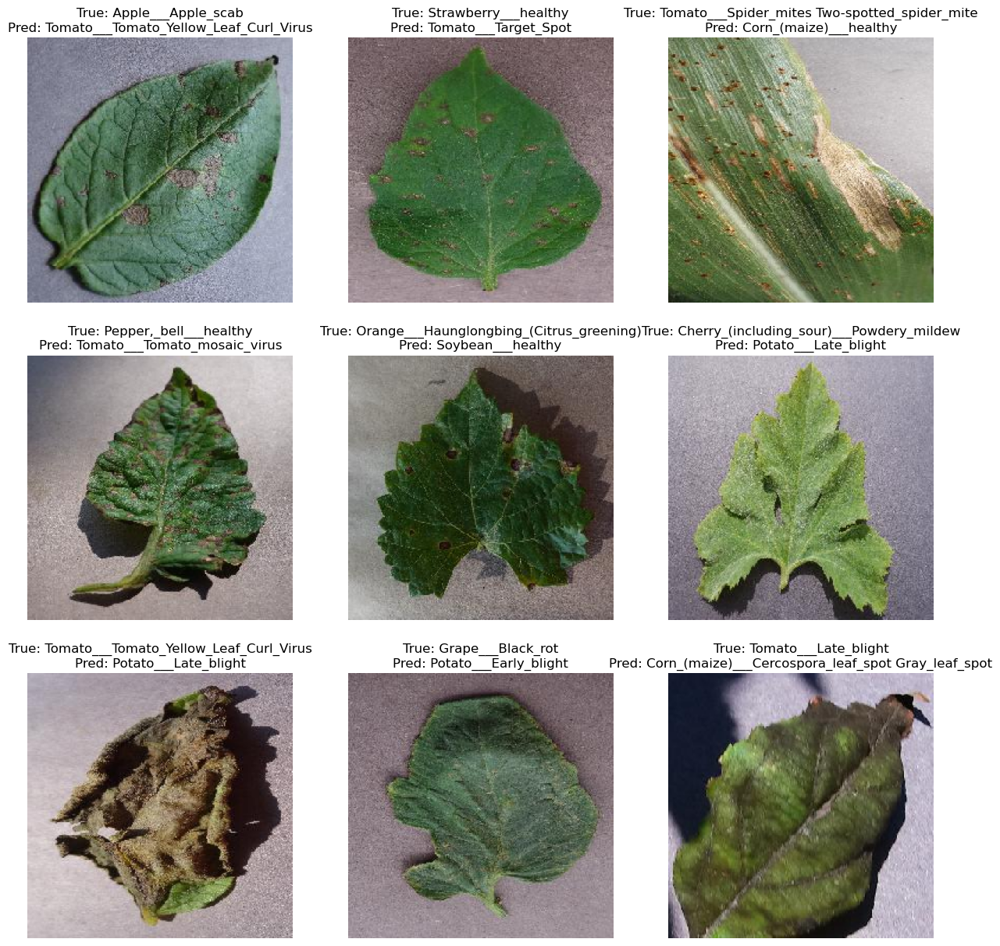

In [27]:
# Visualization of misclassified images
plt.figure(figsize=(15, 15))
for i, row in enumerate(misclassified_images.head(9).itertuples()):
    img_path = test_df.iloc[row.Index]['image_path']
    img = keras_image.load_img(img_path, target_size=(224, 224))
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    true_label = class_folders[row._1]  # Use 'True Label' as defined in error_df
    pred_label = class_folders[row._2]  # Use 'Predicted Label' as defined in error_df
    plt.title(f'True: {true_label}\nPred: {pred_label}')
    plt.axis('off')
plt.show()

In [29]:
# Calculate performance metrics
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels_dict))

Test Loss: 0.1262810379266739
Test Accuracy: 0.9591197967529297

Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.91      0.95      0.93       119
                                 Apple___Black_rot       1.00      0.98      0.99       123
                          Apple___Cedar_apple_rust       1.00      1.00      1.00       234
                                   Apple___healthy       1.00      0.85      0.92       237
                               Blueberry___healthy       0.87      1.00      0.93       269
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00       214
                 Cherry_(including_sour)___healthy       1.00      0.99      0.99        89
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.99      1.00      1.00      1149
                       Corn_(maize)___Common_rust_       1.00      0.98      0.99  

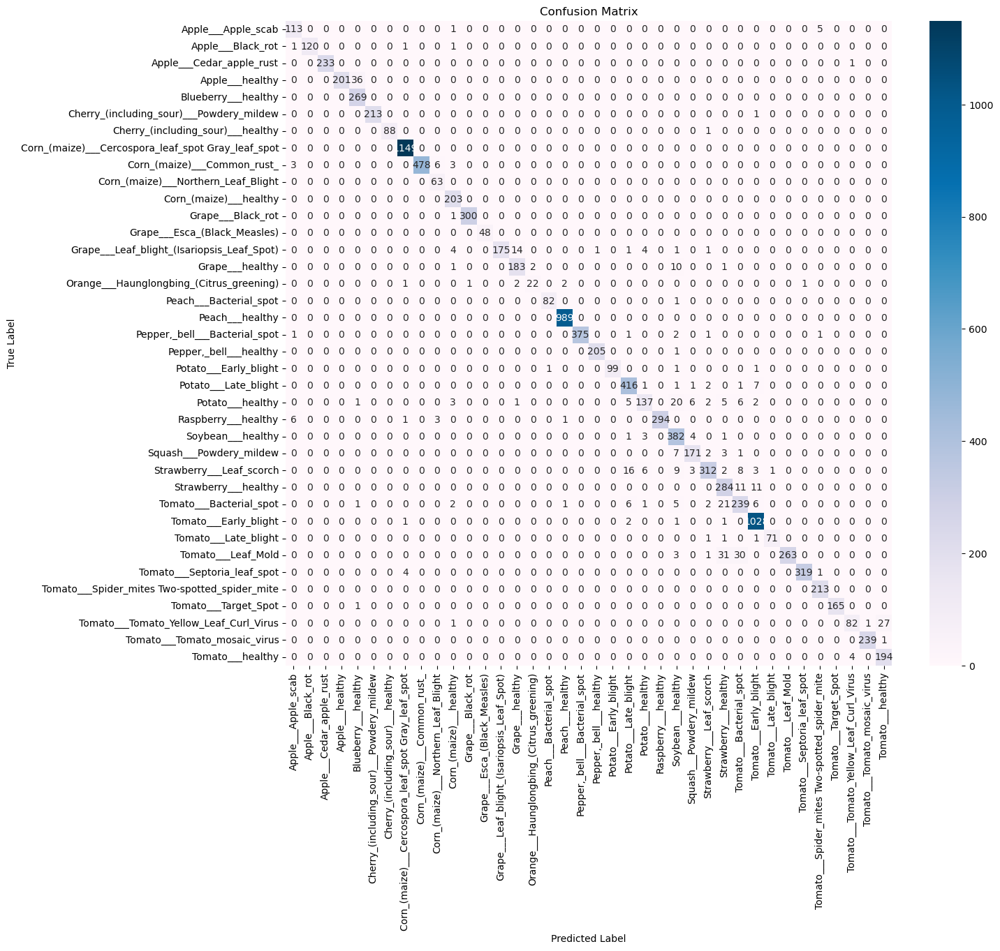

In [34]:
# Calculate the confusion matrix
plt.figure(figsize=(14, 12))
conf_matrix = confusion_matrix(y_true, y_pred)
class_names = list(class_labels_dict.keys())
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='PuBu', xticklabels=class_names, 
            yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

## Prediction Using the Saved Model

1/1 [==============================] - 0s 23ms/step


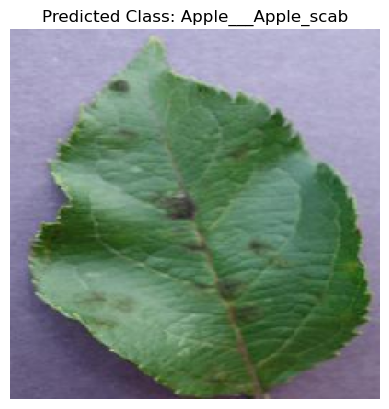

In [36]:
# Use the loaded model for making predictions on new images
new_image_path = '/kaggle/input/plantvillage-dataset/color/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG'
new_image = keras_image.load_img(new_image_path, target_size=image_size)
new_image_array = keras_image.img_to_array(new_image)
new_image_array = np.expand_dims(new_image_array, axis=0)
new_image_array = new_image_array / 255.0  # Normalize the image

# Get the predicted class probabilities
predicted_probabilities = loaded_model.predict(new_image_array)[0]
predicted_class_index = np.argmax(predicted_probabilities)

# Define the class_labels_dict with class labels and corresponding indices
class_labels_dict = {
    0: 'Apple___Apple_scab',
    1: 'Apple___Black_rot',
    2: 'Apple___Cedar_apple_rust',
    3: 'Apple___healthy',
    4: 'Blueberry___healthy',
    5: 'Cherry_(including_sour)___Powdery_mildew',
    6: 'Cherry_(including_sour)___healthy',
    7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
    8: 'Corn_(maize)___Common_rust_',
    9: 'Corn_(maize)___Northern_Leaf_Blight',
    10: 'Corn_(maize)___healthy',
    11: 'Grape___Black_rot',
    12: 'Grape___Esca_(Black_Measles)',
    13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
    14: 'Grape___healthy',
    15: 'Orange___Haunglongbing_(Citrus_greening)',
    16: 'Peach___Bacterial_spot',
    17: 'Peach___healthy',
    18: 'Pepper,_bell___Bacterial_spot',
    19: 'Pepper,_bell___healthy',
    20: 'Potato___Early_blight',
    21: 'Potato___Late_blight',
    22: 'Potato___healthy',
    23: 'Raspberry___healthy',
    24: 'Soybean___healthy',
    25: 'Squash___Powdery_mildew',
    26: 'Strawberry___Leaf_scorch',
    27: 'Strawberry___healthy',
    28: 'Tomato___Bacterial_spot',
    29: 'Tomato___Early_blight',
    30: 'Tomato___Late_blight',
    31: 'Tomato___Leaf_Mold',
    32: 'Tomato___Septoria_leaf_spot',
    33: 'Tomato___Spider_mites Two-spotted_spider_mite',
    34: 'Tomato___Target_Spot',
    35: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    36: 'Tomato___Tomato_mosaic_virus',
    37: 'Tomato___healthy'
}

# Check if the predicted_class_index is present in the dictionary
if predicted_class_index in class_labels_dict:
    predicted_class_label = class_labels_dict[predicted_class_index]
else:
    predicted_class_label = 'Unknown Class'

# Display the image and prediction
plt.imshow(new_image)
plt.title(f"Predicted Class: {predicted_class_label}")
plt.axis('off')
plt.show()